# **Ejercicio 5 - Procesamiento del Imágenes y Visión por Computadora**
# *Alumno: Lucas Demarré*
# *Año: 2024*

---

# **Tabla de contenidos**

1.   [**Librerías**](#)
2.   [**Pasos Previos**](#)
        1.   [*Formateando el video*](#)
        2.   [*Muestra del video*](#)
        3.   [*Funciones útiles*](#)
3.   [**Métodos de Motion Detection (Detección de Movimiento)**](#)
        1.   [*Frame Difference (Diferencia de fotograma)*](#)
        2.   [*Background Subtraction (Sustracción de fondo)*](#)
        3.   [*Optical Sparse flow (Flujo Óptico Disperso)*](#)
        4.   [*Optical Dense Flow (Flujo Óptico Denso)*](#)
        5.   [*Comparación de Tiempos de Ejecución (Gráfico)*](#)
4.   [**Reflexión**](#)

# 1. **Librerías**

In [13]:
import cv2
import time
import ffmpeg
import numpy as np
import mediapy as media
import matplotlib.pyplot as plt

# 2. **Pasos Previos**

## 2.1. *Formateando el video*

In [2]:
#Esto convierte el video a un formato más liviano de trabajo
!ffmpeg -y -i videos/security_camera.mp4 -vf "scale=600:-1" -an -t 60 videos/security_camera_600.mp4

ffmpeg version 4.4.2 Copyright (c) 2000-2021 the FFmpeg developers
  built with clang version 17.0.2
  configuration: --prefix=/d/bld/ffmpeg_1697113950736/_h_env/Library --cc=clang.exe --cxx=clang++.exe --nm=llvm-nm --ar=llvm-ar --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --ld=lld-link --target-os=win64 --enable-cross-compile --toolchain=msvc --host-cc=clang.exe --extra-libs=ucrt.lib --extra-libs=vcruntime.lib --extra-libs=oldnames.lib --strip=llvm-strip --disable-stripping --host-extralibs= --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic --enable-shared --disable-static --enable-version3 --enable-zlib --pkg-config=/d/bld/ffmpeg_1697113950736/_build_env/Library/bin/pkg-config
  libavutil      56. 70.100 / 56. 70.100
  libavcodec     58.134.100 / 58.134.100
  libavformat    58. 76.100 / 58. 76.100
  libav

## 2.2. *Muestra del video*

In [3]:
url = 'videos/security_camera_600.mp4'
video = media.read_video(url)
media.show_video(video)

## 2.3. *Funciones útiles*

In [4]:
''' Función para dibujar los Bounding Boxes '''
def draw_contours(frame, contours, color=(0, 255, 0), thickness=2):
    # Comprobamos si la imagen es en escala de grises
    if len(frame.shape) == 2 or frame.shape[2] == 1: result_image = cv2.cvtColor(frame, cv2.COLOR_GRAY2BGR) # Convertimos la imagen de escala de grises a color
    else: result_image = frame.copy() # Si ya es una imagen de color, simplemente hacemos una copia

    # Dibujamos cada contorno en la imagen
    for contour in contours: 
        x, y, w, h = cv2.boundingRect(contour) # Obtenemos el rectángulo delimitador para cada contorno
        cv2.rectangle(result_image, (x, y), (x + w, y + h), color, thickness) # Dibujamos el rectángulo
    return result_image

''' Función para procesar un video '''
def video_processor(filename_in, filename_out, process_func, max_time=10, **kwargs):
    # Abrimos el video de entrada para lectura
    with media.VideoReader(filename_in) as r:
        # Creamos un archivo de video de salida
        with media.VideoWriter(filename_out, shape=r.shape, fps=r.fps, bps=r.bps) as w:
            count = 0  # Inicializamos el contador de fotogramas
            prev_image = None  # Inicializamos la imagen previa

            # Iteramos sobre cada fotograma del video
            for image in r:
                new_image = media.to_uint8(image)  # Convertimos la imagen a formato flotante

                # Comprobamos si es la primera imagen
                if prev_image is None: prev_image = new_image.copy()

                # Procesamos la imagen utilizando la función dada
                processed_image = process_func(new_image, prev_image, **kwargs)

                # Añadimos la imagen procesada al video de salida
                w.add_image(processed_image)

                # Actualizamos la imagen previa
                prev_image = new_image.copy()
                count += 1 # Incrementamos el contador de fotogramas

                # Detenemos el proceso si se alcanza el tiempo máximo
                if count >= max_time * r.fps: break

# 3. **Métodos de Motion Detection (Detección de Movimiento)**

## 3.1. *Frame Difference (Diferencia de fotograma)*

In [5]:
''' Función para detectar movimientos con Frame Difference y dibujar cuadros delimitadores '''
def process_frame_difference_full(new_image, prev_image, **kwargs):
    # Convertimos las imágenes a escala de grises
    new_gray = cv2.cvtColor(new_image, cv2.COLOR_RGB2GRAY)
    prev_gray = cv2.cvtColor(prev_image, cv2.COLOR_RGB2GRAY)

    # Calculamos la diferencia absoluta entre los fotogramas actuales y anteriores
    frame_diff = cv2.absdiff(new_gray, prev_gray)

    # Normalizamos la imagen de diferencia
    norm_diff = cv2.normalize(frame_diff, None, 0, 255, cv2.NORM_MINMAX)

    # Umbralizamos la imagen para resaltar las diferencias
    _, thresh = cv2.threshold(norm_diff, 30, 255, cv2.THRESH_BINARY)

    # Dilatamos la imagen umbralizada para mejorar la detección de contornos
    kernel = np.ones((5,5),np.uint8)
    dilated = cv2.dilate(thresh, kernel, iterations = 1)

    # Convertimos la imagen dilatada a formato adecuado para findContours
    dilated = dilated.astype(np.uint8)

    # Encontramos los contornos en la imagen dilatada
    contours, _ = cv2.findContours(dilated, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Dibujamos los cuadros delimitadores alrededor de los contornos
    result_image = draw_contours(new_image, contours)
    return result_image

# Nombres de los archivos de video de entrada y salida
filename_in = 'videos/security_camera_600.mp4'
filename_out = 'videos/videos_motion_detection/security_camera_fdfull.mp4'

start = time.time()
video_processor(filename_in, filename_out, process_frame_difference_full, max_time=60) # Llamamos a la función para procesar el video
media.show_video(media.read_video(filename_out), fps=60) # Mostramos el video resultante
end = time.time()

FD_time = end - start
print(f'Tiempo de ejecución: {FD_time:.2f} segundos.')

Tiempo de ejecución: 10.62 segundos.


## 3.2. *Background Subtraction (Sustracción de fondo)*

In [9]:
''' Función para detectar movimientos con Background Subtraction y dibujar cuadros delimitadores '''
def process_back_sub(new_image, prev_image, **kwargs):
    # Inicializamos el sustractor de fondo si aún no se ha hecho
    if not hasattr(process_back_sub, 'init_done'): 
        # Obtener el método de sustracción de fondo especificado
        process_back_sub.back_method = cv2.createBackgroundSubtractorMOG2(detectShadows=kwargs.get('detect_shadows', True))
        process_back_sub.init_done = True

    # Aplicar el método de sustracción de fondo seleccionado a la nueva imagen
    back_method = process_back_sub.back_method
    foreground_mask = back_method.apply(new_image)

    # Umbralizar la máscara para resaltar los objetos en movimiento
    _, thresh = cv2.threshold(foreground_mask, kwargs.get('threshold_val', 30), 255, cv2.THRESH_BINARY)

    # Aplicar erosión y dilatación para mejorar la segmentación
    kernel_size = kwargs.get('kernel_size', 5)
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    thresh = cv2.erode(thresh, kernel, iterations=kwargs.get('erode_iterations', 1))
    thresh = cv2.dilate(thresh, kernel, iterations=kwargs.get('dilate_iterations', 1))

    # Encontrar contornos
    contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    result_image = new_image

    # Dibujar cuadros delimitadores (bounding boxes)
    show_boxes = kwargs.get('show_boxes', True)
    if show_boxes:
        for contour in contours:
            if cv2.contourArea(contour) > kwargs.get('min_area', 100):
                x, y, w, h = cv2.boundingRect(contour)
                # Convertir la imagen a cv::UMat
                result_image = cv2.UMat(result_image)
                result_image = cv2.rectangle(result_image, (x, y), (x+w, y+h), (0, 255, 0), 2)
                # Convertir la imagen de cv::UMat a NumPy para continuar con las operaciones
                result_image = result_image.get()
                
    return result_image

# Nombres de los archivos de video de entrada y salida
filename_in = 'videos/security_camera_600.mp4'
filename_out = 'videos/videos_motion_detection/security_camera_bs.mp4'

start = time.time()
video_processor(filename_in, filename_out, process_back_sub, max_time=60) # Llamar a la función para procesar el video
media.show_video(media.read_video(filename_out), fps=60) # Mostrar el video resultante
end = time.time()

BS_time = end - start
print(f'Tiempo de ejecución: {BS_time:.2f} segundos.')

Tiempo de ejecución: 20.30 segundos.


## 3.3. *Optical Sparse flow (Flujo Óptico Disperso)*

In [10]:
''' Función para procesar el flujo óptico disperso '''
def process_sparse_optical_flow(new_image, prev_image):
    # Preparamos las imagenes de trabajo
    new_gray = cv2.cvtColor(new_image, cv2.COLOR_BGR2GRAY)
    prev_gray_image = cv2.cvtColor(prev_image, cv2.COLOR_BGR2GRAY)

    # Verificamos si ya se han detectado las características de Shi-Tomasi
    if not hasattr(process_sparse_optical_flow, 'shi_tomasi_done'):
        feature_params = dict(maxCorners=300, qualityLevel=0.2, minDistance=2, blockSize=7) # Definimos los parámetros para la detección de esquinas de Shi-Tomasi
        process_sparse_optical_flow.prev_points = cv2.goodFeaturesToTrack(new_gray, mask=None, **feature_params) # Detectamos los puntos característicos en la imagen
        process_sparse_optical_flow.mask = np.zeros_like(new_image) # Creamos una máscara para dibujar el flujo óptico
        process_sparse_optical_flow.shi_tomasi_done = True # Marcamos que se ha completado la detección de Shi-Tomasi

    # Continuamos si se ha completado la detección de Shi-Tomasi
    if process_sparse_optical_flow.shi_tomasi_done:
        prev_points = process_sparse_optical_flow.prev_points
        mask = process_sparse_optical_flow.mask

    # Parámetros para el flujo óptico de Lucas-Kanade
    lk_params = dict(winSize=(15, 15), maxLevel=2, criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))
    new_points, status, error = cv2.calcOpticalFlowPyrLK(prev_gray_image, new_gray, prev_points, None, **lk_params) # Calculamos el flujo óptico de Lucas-Kanade
    
    # Filtramos los puntos buenos
    good_old = prev_points[status == 1]
    good_new = new_points[status == 1]
    color = (0, 255, 0)
    
    # Dibujamos el movimiento (flujo óptico)
    for i, (new, old) in enumerate(zip(good_new, good_old)):
        a, b = new.astype(int).ravel()
        c, d = old.astype(int).ravel()
        mask = cv2.line(mask, (a, b), (c, d), color, 2)
        new_image_copy = new_image.copy()
        new_image_copy = cv2.circle(new_image_copy, (a, b), 3, color, -1)

    output = cv2.add(new_image, mask)  # Combinamos la imagen actual con las líneas de flujo óptico dibujadas
    process_sparse_optical_flow.prev_points = good_new.reshape(-1, 1, 2) # Actualizamos los puntos para el siguiente cuadro
    return output

# Nombres de los archivos de video de entrada y salida
filename_in = 'videos/security_camera_600.mp4'
filename_out = 'videos/videos_motion_detection/security_camera_psoflow.mp4'

start = time.time()
video_processor(filename_in, filename_out, process_sparse_optical_flow, max_time=60) # Llamamos a la función para procesar el video
media.show_video(media.read_video(filename_out), fps=60) # Mostramos el video resultante
end = time.time()

OSF_time = end - start
print(f'Tiempo de ejecución: {OSF_time:.2f} segundos.')

Tiempo de ejecución: 38.22 segundos.


## 3.4. *Optical Dense Flow (Flujo Óptico Denso)*

In [11]:
''' Función para procesar el flujo óptico denso '''
def process_dense_optical_flow(new_image, prev_image):
    gray = cv2.cvtColor(new_image, cv2.COLOR_BGR2GRAY) # Convertimos la nueva imagen a escala de grises

    if not hasattr(process_dense_optical_flow, 'init_done'):
        process_dense_optical_flow.prev_gray = cv2.cvtColor(new_image, cv2.COLOR_BGR2GRAY)
        process_dense_optical_flow.mask = np.zeros_like(new_image)
        process_dense_optical_flow.mask[..., 1] = 255
        process_dense_optical_flow.init_done = True

    if process_dense_optical_flow.init_done:
        prev_gray = process_dense_optical_flow.prev_gray
        mask = process_dense_optical_flow.mask
    
    flow = cv2.calcOpticalFlowFarneback(prev_gray, gray, None, 0.5, 3, 15, 3, 5, 1.2, 0) # Calculamos el flujo óptico
    magnitude, angle = cv2.cartToPolar(flow[..., 0], flow[..., 1])  # Computamos la magnitud y ángulo de los vectores 2D
    
    mask[..., 0] = angle * 180 / np.pi / 2 # Establecemos el tono de la imagen según la dirección del flujo óptico
    mask[..., 2] = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX) # Establecemos el valor de la imagen según la magnitud del flujo óptico
    
    rgb = cv2.cvtColor(mask, cv2.COLOR_HSV2BGR) # Convertimos de HSV a RGB
    
    process_dense_optical_flow.prev_grayprev_gray = gray.copy() # Actualizamos la imagen previa a gris
    return rgb

# Nombres de los archivos de video de entrada y salida
filename_in = 'videos/security_camera_600.mp4'
filename_out = 'videos/videos_motion_detection/security_camera_pdoflow.mp4'

start = time.time()
video_processor(filename_in, filename_out, process_dense_optical_flow, max_time=60) # Llamamos a la función para procesar el video
media.show_video(media.read_video(filename_out), fps=60) # Mostramos el video resultante
end = time.time()

ODF_time = end - start
print(f'Tiempo de ejecución: {ODF_time:.2f} segundos.')

Tiempo de ejecución: 132.85 segundos.


## 3.5. *Comparación de Tiempos de Ejecución (Gráfico)*

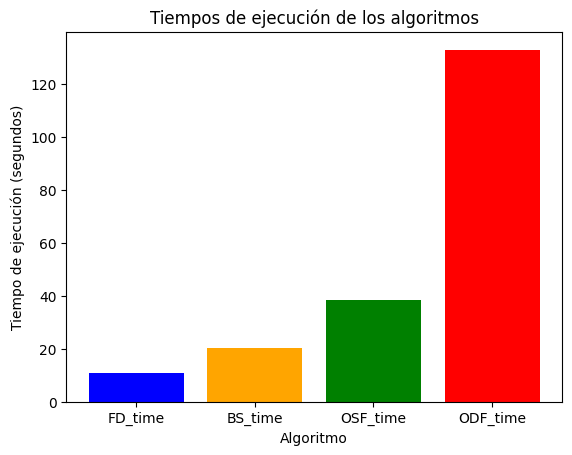

In [14]:
# Definir los nombres de los algoritmos y sus respectivos tiempos de ejecución
algoritmos = ['FD_time', 'BS_time', 'OSF_time', 'ODF_time']
tiempos = [FD_time, BS_time, OSF_time, ODF_time]  # Ejemplo de datos, reemplaza estos números con los tiempos reales

# Crear el gráfico de barras
plt.bar(algoritmos, tiempos, color=['blue', 'orange', 'green', 'red'])

# Agregar etiquetas al gráfico
plt.xlabel('Algoritmo')
plt.ylabel('Tiempo de ejecución (segundos)')
plt.title('Tiempos de ejecución de los algoritmos')

# Mostrar el gráfico
plt.show()

# 4. **Reflexión**

En el video base, tenemos el Buffet vacío en primera instancia durante unos segundos, para luego entrar una persona y dar vueltas por el lugar, esto a lo largo de aproximadamente un minuto. Utilicé varias técnicas para intentar captar de la forma más limpia posible el movimiento de la persona por todo el lugar.

El primer algoritmo utilizado fue **Frame Difference** *(Diferencia de fotograma)*, donde se detecta qué objetos se están moviendo en el video teniendo en cuenta la diferencia que hay entre el fotograma actual y ma anterior. En esta prueba, podemos ver que la persona es captada pero con muchos *falsos positivos*, hay bastante ruido que el algoritmo detecta como movimiento, manchando bastante la detección, cosa que se puede ver solo viendo las Bounding Boxes.

El siguiente algoritmo es **Background Subtraction** *(Sustracción de Fondo)*, en este se detecta el movimiento de un objeto extrayendo el primer plano (objeto en movimiento) y el fondo de una imagen (objeto estacionario). En esta prueba, podemos ver que sí detecta correctamente a la persona y no tiene prácticamente falsos positivos, aunque a veces los Bounding Boxes están cortados o incluso no detecta bien el movimiento, ya que confunde a la persona con el fondo.

El siguiente es **Optical Sparse Flow** *(Flujo Óptico Disperso)*, en este algoritmo se detecta muy bien el movimiento y el recorrido que sigue la persona sobre el lugar, inicio detecta ciertas Bounding Boxes que no son movi, pero como tal es muy poco ruido y el recorrido, que es lo importante, lo detecta perfectamente.

El último es **Optical Dense Flow** *(Flujo Óptico Denso)*, este último algoritmo detecta el movimiento al principio con mucho ruido, parece como si todo el fondo tuviera movimiento, luego cuando la persona entra en pasealla, él apaga un poco ese ruido y se centra en detectar el movimiento de la persona, aunque aún existe ruido que llega a molestar en la detección.

En conclusión, el mejor algoritmo en cuanto a tiempo de ejecución y objetivo (capturar el movimiento de una persona en un lugar) es **Background Subtraction**, nos da una detección limpia sin prácticamente ruido y su ejecución es bast con respecto a las otras opciones como **Optical Sparse FLow** o **Optical Dense Flow** que también tienen resultados mejores a **Frame Difference** pero son peores en cuestión de resultado y tiempo a **Background Subtraction**ante veloz.a.